<a href="https://colab.research.google.com/github/arfianaja/yolov5_train/blob/main/70%2C15%2C15_yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

install requirements

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16000, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 16000 (delta 20), reused 19 (delta 12), pack-reused 15967
Receiving objects: 100% (16000/16000), 14.66 MiB | 20.85 MiB/s, done.
Resolving deltas: 100% (10986/10986), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.6/615.6 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.8 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 (Tesla T4)


In [ ]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.1 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.0.76
    Uninstalling opencv-python-headless-4.8.0.76:
      Successfully uninstalled 

In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy", model_format="yolov5", notebook="roboflow-yolov5")

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

masukkan kode dari roboflow


In [ ]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy")
project = rf.workspace("universitas-muhammadiyah-sorong").project("deteksi-kursi-9fb7l")
dataset = project.version(8).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/deteksi-kursi-8 in yolov5pytorch:: 100%|██████████| 1140/1140 [00:00<00:00, 7976.20it/s]


Train Our Custom YOLOv5 model
Here, we are able to pass a number of arguments:

img: menentukan ukuran gambar masukan

batch: menentukan ukuran batch

epochs: menentukan jumlah periode pelatihan. (Catatan: sering kali, 3000+ adalah umum di sini!)

data: Lokasi dataset kami disimpan di dataset.location

weights: tentukan jalur ke bobot untuk memulai transfer pembelajaran. Di sini kami memilih pos pemeriksaan pretrained COCO umum.

cache: gambar cache untuk pelatihan lebih cepat

In [ ]:
!python train.py --img 416 --batch 32 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

train: weights=yolov5s.pt, cfg=, data=/content/datasets/deteksi-kursi-8/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-225-gbb9706e Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_ga

** Evaluasi Performa Detektor YOLOv5 Khusus Kerugian pelatihan dan metrik kinerja disimpan ke Tensorboard dan juga ke file log.**

**If you are new to these metrics, the one you want to focus on is mAP_0.5 - learn more about mean average precision here.**


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs
%reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4692), started 0:01:11 ago. (Use '!kill 4692' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/deteksi-kursi-8/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-225-gbb9706e Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/84 /content/datasets/deteksi-kursi-8/test/images/WhatsApp-Image-2023-08-22-at-00-33-47_jpeg.rf.e356e4ee7e42b635dc286578b5175279.jpg: 416x416 11 Kursi_Kosongs, 1 Kursi_Terisi, 7.4ms
image 2/84 /content/datasets/deteksi-kursi-8/test/images/WhatsApp-Image-2023-08-22-at-00-33-59-2-_jpeg.r

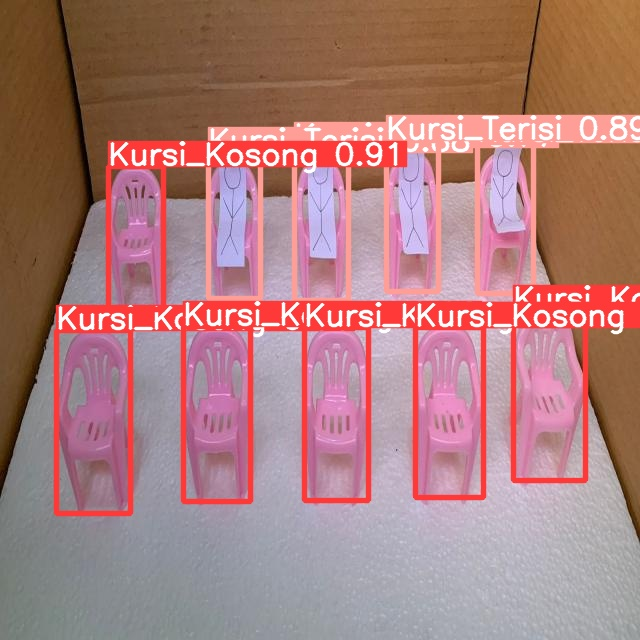

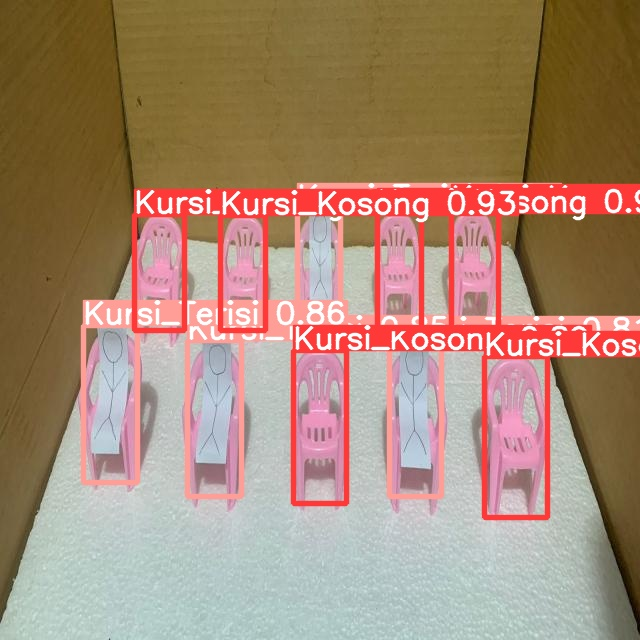

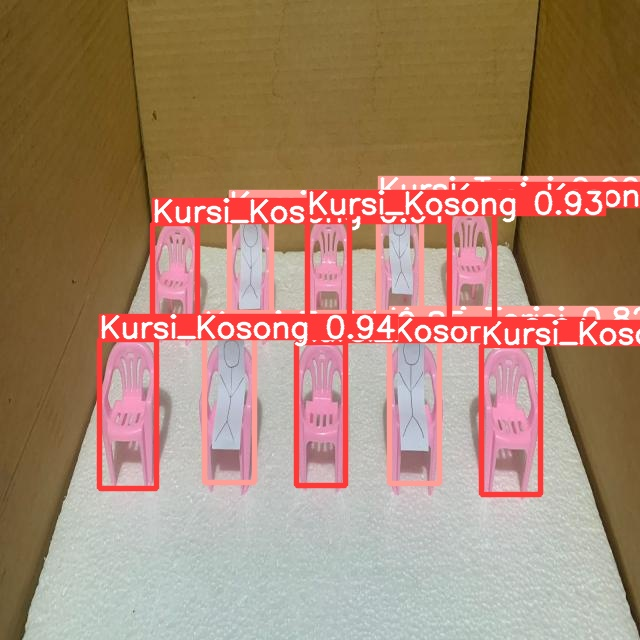

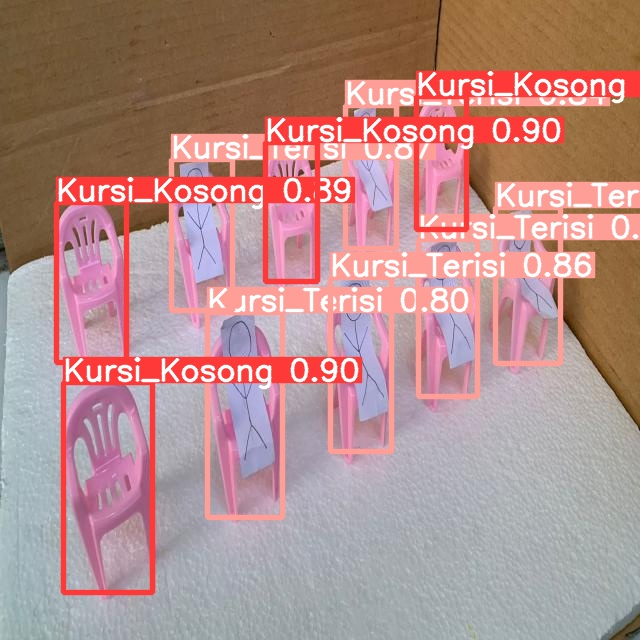

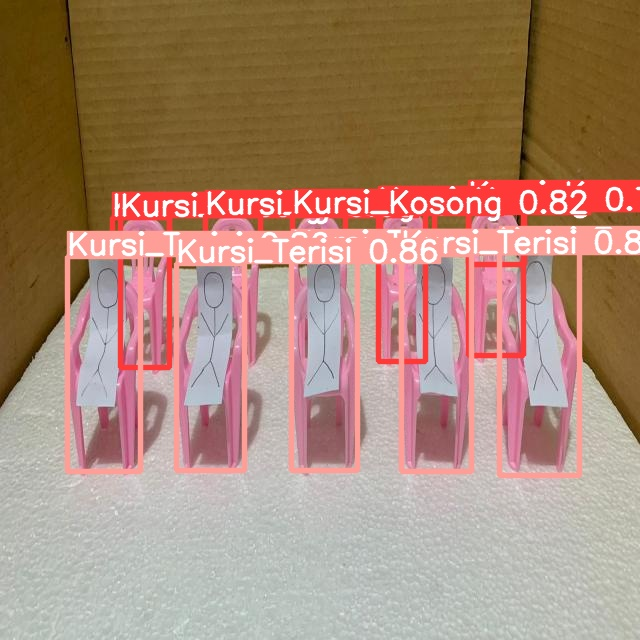

...

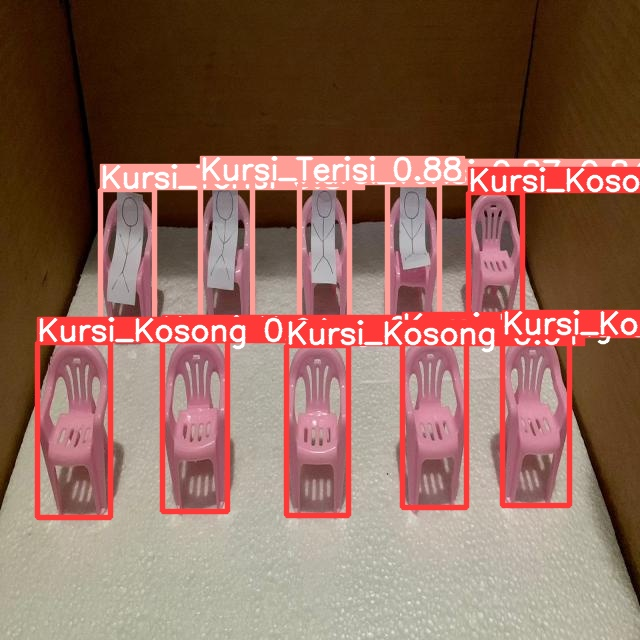

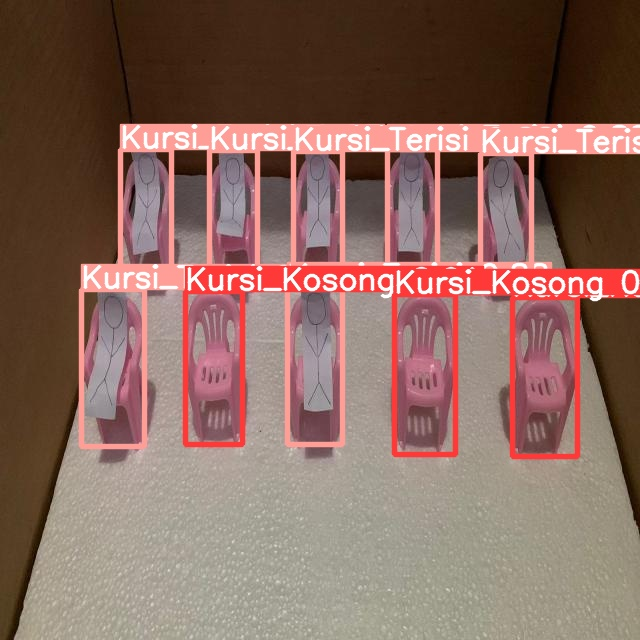

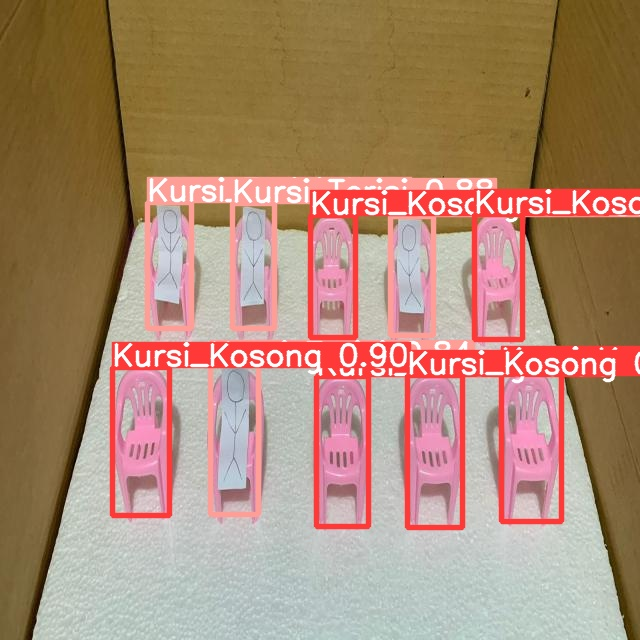

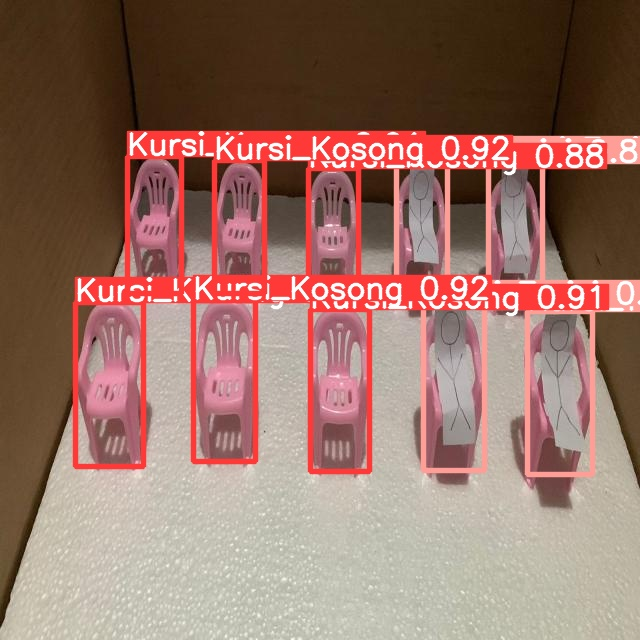

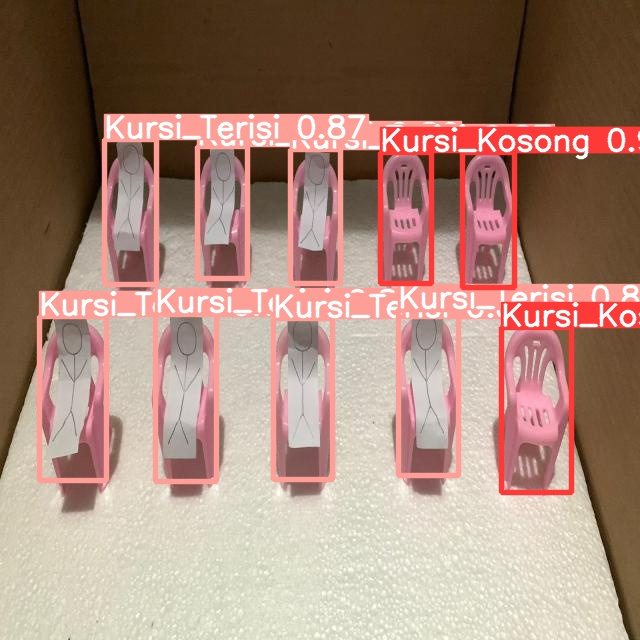

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/deteksi-kursi-8/data.yaml --img 416 --iou 0.65 --half

val: data=/content/datasets/deteksi-kursi-8/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-225-gbb9706e Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/datasets/deteksi-kursi-8/valid/labels.cache... 84 images, 0 backgrounds, 0 corrupt: 100% 84/84 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:07<00:00,  2.63s/it]
                   all         84        831      0.976      0.983      0.984      0.724
          Kursi_Kosong         84        480      0.994       0.99      0.995

In [ ]:
!ls runs/train/yolov5s_results

confusion_matrix.png				    results.csv
events.out.tfevents.1696061746.f778b8990bdd.1181.0  results.png
F1_curve.png					    train_batch0.jpg
hyp.yaml					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
opt.yaml					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights


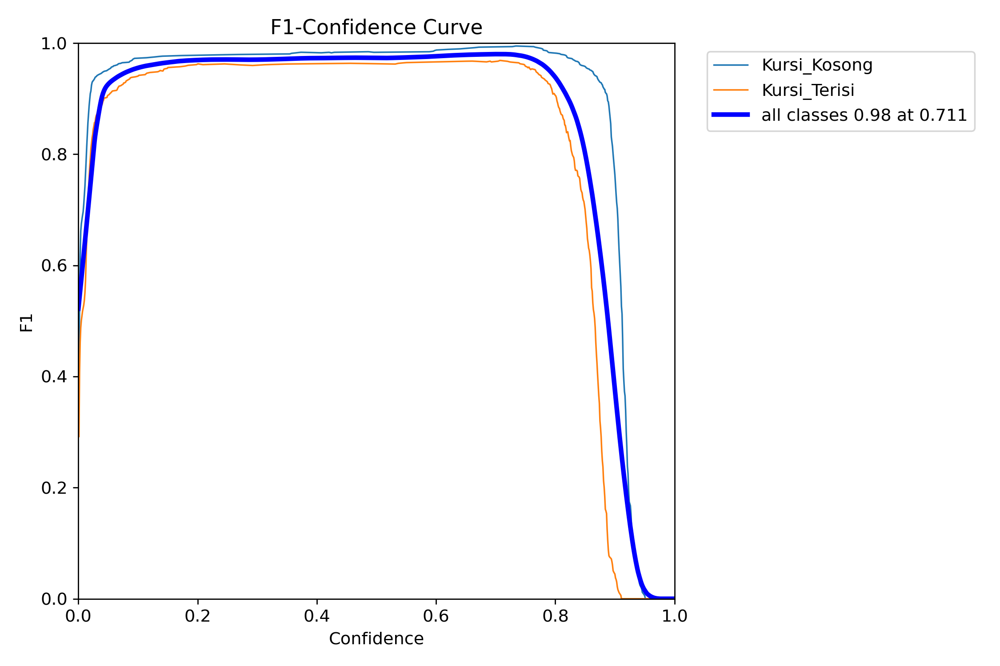

In [ ]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/F1_curve.png', width=1000)

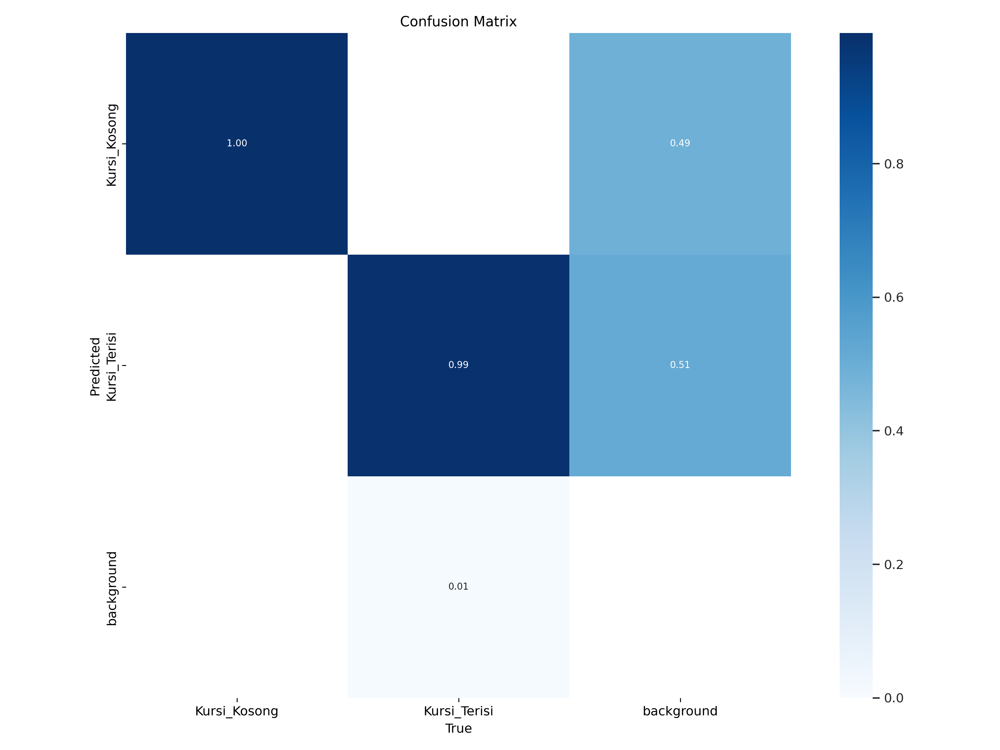

In [ ]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=1000)

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/T.png

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/T.png, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-167-g5deff14 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
image 1/1 /content/T.png: 416x288 1 T, 44.8ms
Speed: 0.3ms pre-process, 44.8ms inference, 93.3ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp5


In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/P_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/PR_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/R_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/F1_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>